# Part 1. Project Settings

In [1]:
# 1-1. import Packages
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import tensorflow as tf
from tensorflow.keras.layers import Input, Dense, Reshape, Flatten, Dropout, Conv2DTranspose
from tensorflow.keras.layers import BatchNormalization, Activation, LeakyReLU, UpSampling2D, Conv2D
from tensorflow.keras.models import Sequential, Model

In [2]:
# 1-2. Interlock Google Drive
from google.colab import drive
drive.mount('drive')

Mounted at drive


# Part 2. Preparing Data

In [3]:
# 2-1. Retrieve CSV data
data = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/khuda_winterstudy/font_info3.csv')  # 우리꺼 데이터셋 불러오기
data.shape

(5880, 1024)

In [4]:
# 2-2. 3D Vector conversion
width, height, channel = 32, 32, 1  # 이미지 사이즈 32*32 pixel

X = data.values
X = X.reshape((X.shape[0], width, height, channel))

In [5]:
print(X.shape)

(5880, 32, 32, 1)


In [6]:
# 2-3. Image Pixel Normalization [0,255] -> [-1,1]
X = (X-127.5)/127.5

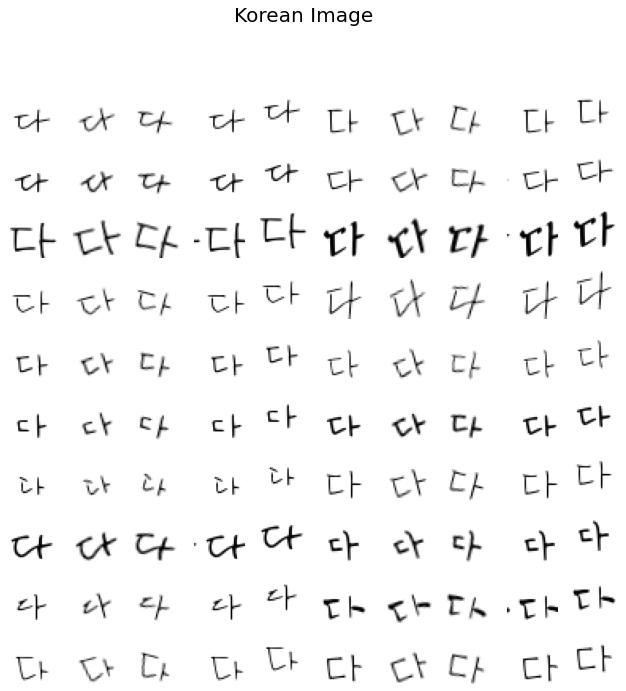

In [7]:
# 2-4. Visualization of Korean images

plt.figure(figsize=(11,11))

i = 1
for image in X:
  plt.subplot(10,10,i)  # (10*10) 총 100칸
  image = image.reshape(width, height)
  plt.imshow(image, cmap='gray')
  plt.axis('off')
  i+=1
  if i>100: break

plt.suptitle("Korean Image", fontsize=20)
plt.show()

In [8]:
# 2-5. Preparing the learning data batch

BATCH_SIZE = 64

# Input dataset + image random shuffle
train_dataset = tf.data.Dataset.from_tensor_slices(X) # tf.data.Dataset.from_tensor_slices(X) : numpy array x(input)를 Dataset으로 변환
train_dataset = train_dataset.shuffle(X.shape[0]).batch(BATCH_SIZE) 

# Part 3. Generator Model

In [9]:
# 3-1. Organizing Generator Model Network

def build_generator_model():
  model = tf.keras.Sequential()

  model.add(Dense(1024, input_dim=100, use_bias=False))  # 노드 개수 자율적으로 설정, input_dim에 노이즈 개수 설정
  model.add(BatchNormalization())
  model.add(Activation(LeakyReLU(0.2)))

  model.add(Dense(8*8*128, use_bias=False))
  model.add(BatchNormalization())
  model.add(Activation(LeakyReLU(0.2)))

  # Reshape (8*8)
  model.add(Reshape((8,8,128)))
  
  model.add(Conv2DTranspose(128, (5,5), strides=(1,1), padding='same', use_bias=False))
  model.add(BatchNormalization())
  model.add(Activation(LeakyReLU(0.2)))

  # (8*8) -> (16*16)
  model.add(Conv2DTranspose(64, (5,5), strides=(2,2), padding='same', use_bias=False))
  model.add(BatchNormalization())
  model.add(Activation(LeakyReLU(0.2)))

  # (16*16) -> (32*32)
  model.add(Conv2DTranspose(1, (5,5), strides=(2,2), padding='same', activation='tanh'))
  assert model.output_shape == (None, 32, 32, 1)
  
  return model

In [10]:
# 3-2. Building Generator Model
generator = build_generator_model()
generator.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 1024)              102400    
                                                                 
 batch_normalization (BatchN  (None, 1024)             4096      
 ormalization)                                                   
                                                                 
 activation (Activation)     (None, 1024)              0         
                                                                 
 dense_1 (Dense)             (None, 8192)              8388608   
                                                                 
 batch_normalization_1 (Batc  (None, 8192)             32768     
 hNormalization)                                                 
                                                                 
 activation_1 (Activation)   (None, 8192)              0

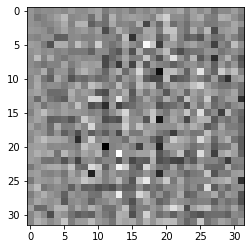

In [11]:
# 3-3. Images created by an untrained Generator Model

noise = tf.random.normal([1, 100])
generated_image = generator(noise, training=False)

plt.imshow(generated_image[0,:,:,0], cmap='gray')

# Part 4. Discriminator Model

In [12]:
# 4-1. Organizing Discrimiator Model Network

def build_discriminator_model():

  model = tf.keras.Sequential()

  model.add(Conv2D(64, (5,5), strides=2, padding='same', input_shape=[32,32,1]))  # input 이미지 크기
  model.add(LeakyReLU(0.2))
  model.add(Dropout(0.3))

  model.add(Conv2D(128, (5,5), strides=2, padding='same'))
  model.add(LeakyReLU(0.2))

  model.add(Flatten())

  model.add(Dense(256))
  model.add(Activation(LeakyReLU(0.2)))
  model.add(Dropout(0.3))

  model.add(Dense(1))

  return model

In [13]:
# 4-2. Building Discriminator Model

discriminator = build_discriminator_model()
discriminator.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 16, 16, 64)        1664      
                                                                 
 leaky_re_lu_4 (LeakyReLU)   (None, 16, 16, 64)        0         
                                                                 
 dropout (Dropout)           (None, 16, 16, 64)        0         
                                                                 
 conv2d_1 (Conv2D)           (None, 8, 8, 128)         204928    
                                                                 
 leaky_re_lu_5 (LeakyReLU)   (None, 8, 8, 128)         0         
                                                                 
 flatten (Flatten)           (None, 8192)              0         
                                                                 
 dense_2 (Dense)             (None, 256)              

In [14]:
# 4-3. Result of untrained Discriminator Model

predicted = discriminator(generated_image)
print(predicted)

tf.Tensor([[-7.506792e-05]], shape=(1, 1), dtype=float32)


# Part 5. Optimizer + Loss Function

In [15]:
# 5-1. Build Optimizer

# for Generator
generator_optimizer = tf.keras.optimizers.Adam(0.002)
# for Discriminator
discriminator_optimizer = tf.keras.optimizers.Adam(0.002)

In [16]:
# 5-2. BinaryCrossentropy for minMax

cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [17]:
# 5-3. Generator Loss function

# The goal of the Generator Model: When the Discriminator Model determines a fake image, it makes the value of discrimination close to 1
def generator_loss(fake_output):
  return cross_entropy(tf.ones_like(fake_output), fake_output)  # 1과 가짜 이미지 판별값 비교

In [18]:
# 5-4. Discriminator Loss function

# The goal of the Discriminator Model:
# 1. When the real image is determined, the discrimination value is close to 1
# 2. When the fake image is determined, the discrimination value is close to zero
def discriminator_loss(real_output, fake_output):
  real_loss = cross_entropy(tf.ones_like(real_output), real_output)  # 1. Comparison of real image discrimination values with 1
  fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output) # 2. Comparison of fake image discrimination values with zero
  total_loss = real_loss + fake_loss
  return total_loss

# Part 6. GAN training

In [19]:
# 6-1. Set training value

EPOCHS = 300
noise_dim = 100

@tf.function
def train_step(images):
  # Generator input noise
  noise = tf.random.normal([BATCH_SIZE, noise_dim])
  # Gradient descent calculations and updating parameters
  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
    generated_images = generator(noise, training=True)

    real_output = discriminator(images, training=True)
    fake_output = discriminator(generated_images, training=True)

    gen_loss = generator_loss(fake_output)
    disc_loss = discriminator_loss(real_output, fake_output)
    print(real_output, fake_output)

  gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
  gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

  generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
  discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

In [20]:
# 6-2. Visualization of test noise

test_noise = tf.random.normal([100, noise_dim])  # Test noise for visualization of the training

def show_generated_images(epoch):
  images = generator.predict(test_noise)
  images = 0.5 * images + 0.5

  plt.figure(figsize=(11,11))

  i = 1
  for image in images:
    image = image.reshape(width, height)
    plt.subplot(10, 10, i)
    plt.imshow(image, cmap='gray')
    plt.axis('off')
    i+=1

  plt.suptitle("Generated Images on EPOCH: %s" % epoch, fontsize=25)
  plt.show

In [21]:
# 6-3. Code for training
def train(dataset, epochs):
  for epoch in range(epochs):  # Set the total number of data training iterations(300)

    for image_batch in dataset: # Train batch(64)
      train_step(image_batch)

    print("%s epochs trained" % epoch)

    if epoch % 5 == 0: # Visualize the image every fifth epoch
      show_generated_images(epoch)


Tensor("sequential_1/dense_3/BiasAdd:0", shape=(64, 1), dtype=float32) Tensor("sequential_1/dense_3/BiasAdd_1:0", shape=(64, 1), dtype=float32)
Tensor("sequential_1/dense_3/BiasAdd:0", shape=(64, 1), dtype=float32) Tensor("sequential_1/dense_3/BiasAdd_1:0", shape=(64, 1), dtype=float32)
Tensor("sequential_1/dense_3/BiasAdd:0", shape=(56, 1), dtype=float32) Tensor("sequential_1/dense_3/BiasAdd_1:0", shape=(64, 1), dtype=float32)
0 epochs trained
4/4 [==============================] - 0s 10ms/step
1 epochs trained
2 epochs trained
3 epochs trained
4 epochs trained
5 epochs trained
4/4 [==============================] - 0s 3ms/step
6 epochs trained
7 epochs trained
8 epochs trained
9 epochs trained
10 epochs trained
4/4 [==============================] - 0s 4ms/step
11 epochs trained
12 epochs trained
13 epochs trained
14 epochs trained
15 epochs trained
4/4 [==============================] - 0s 3ms/step
16 epochs trained
17 epochs trained
18 epochs trained
19 epochs trained
20 epochs tra

<ipython-input-20-8e141511e627>:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(11,11))


101 epochs trained
102 epochs trained
103 epochs trained
104 epochs trained
105 epochs trained
4/4 [==============================] - 0s 3ms/step
106 epochs trained
107 epochs trained
108 epochs trained
109 epochs trained
110 epochs trained
4/4 [==============================] - 0s 3ms/step
111 epochs trained
112 epochs trained
113 epochs trained
114 epochs trained
115 epochs trained
4/4 [==============================] - 0s 3ms/step
116 epochs trained
117 epochs trained
118 epochs trained
119 epochs trained
120 epochs trained
4/4 [==============================] - 0s 7ms/step
121 epochs trained
122 epochs trained
123 epochs trained
124 epochs trained
125 epochs trained
4/4 [==============================] - 0s 3ms/step
126 epochs trained
127 epochs trained
128 epochs trained
129 epochs trained
130 epochs trained
4/4 [==============================] - 0s 3ms/step
131 epochs trained
132 epochs trained
133 epochs trained
134 epochs trained
135 epochs trained
4/4 [========================

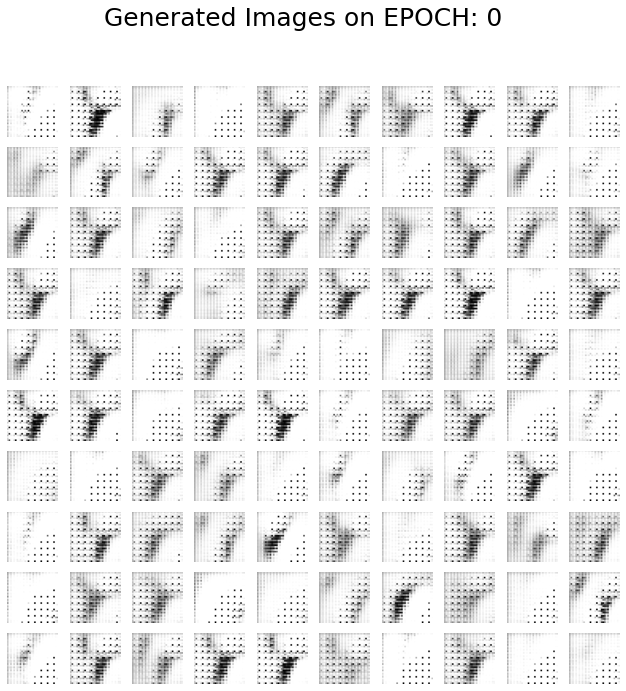

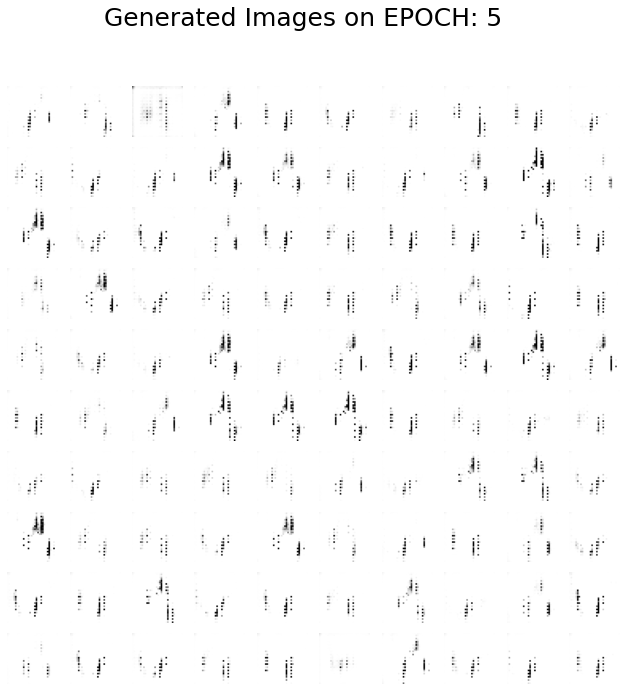

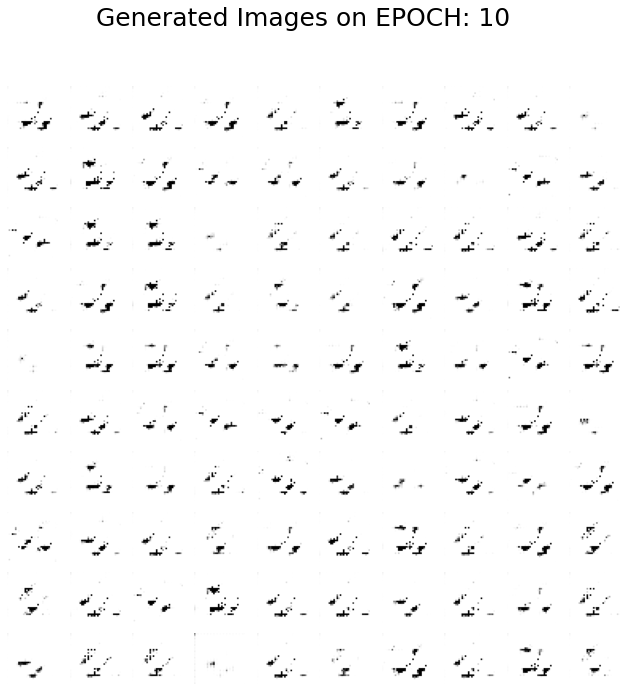

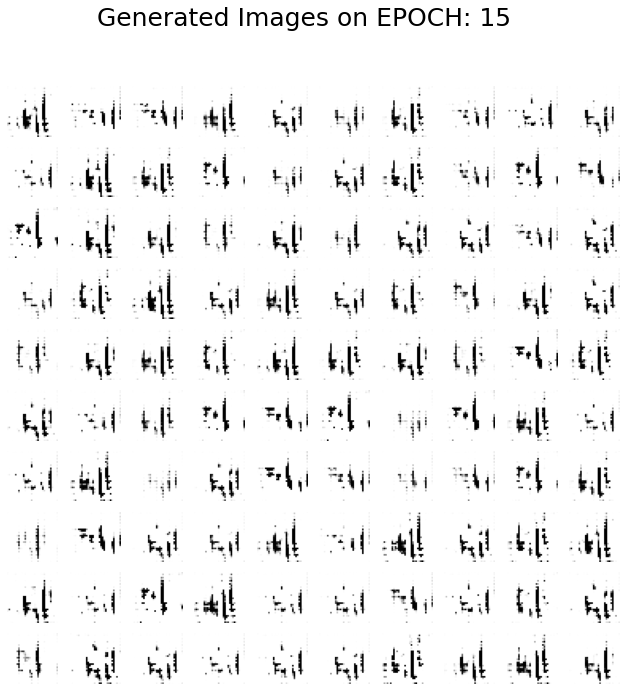

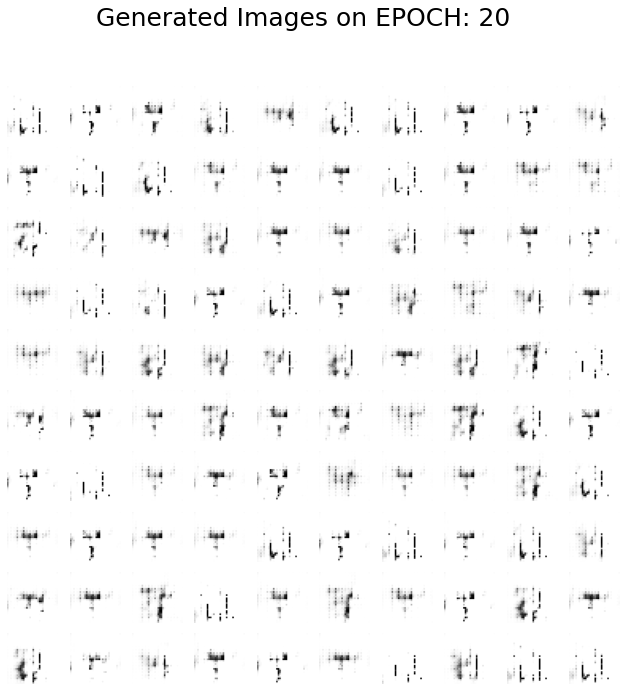

...

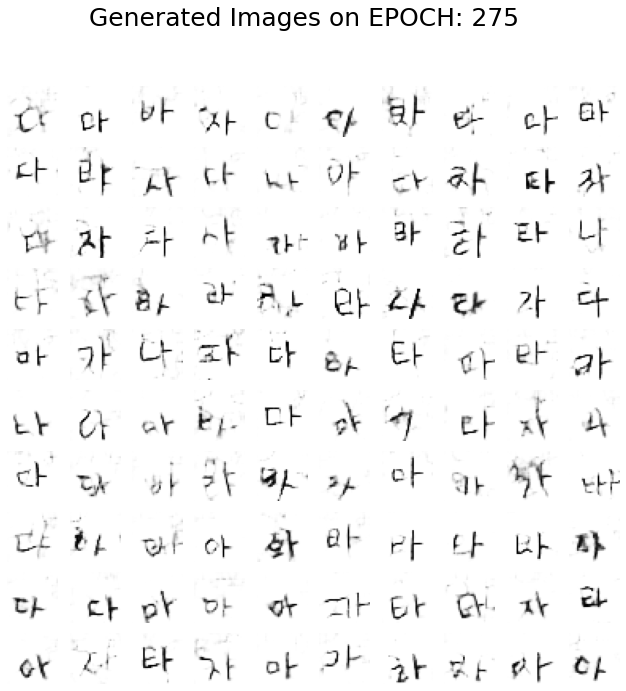

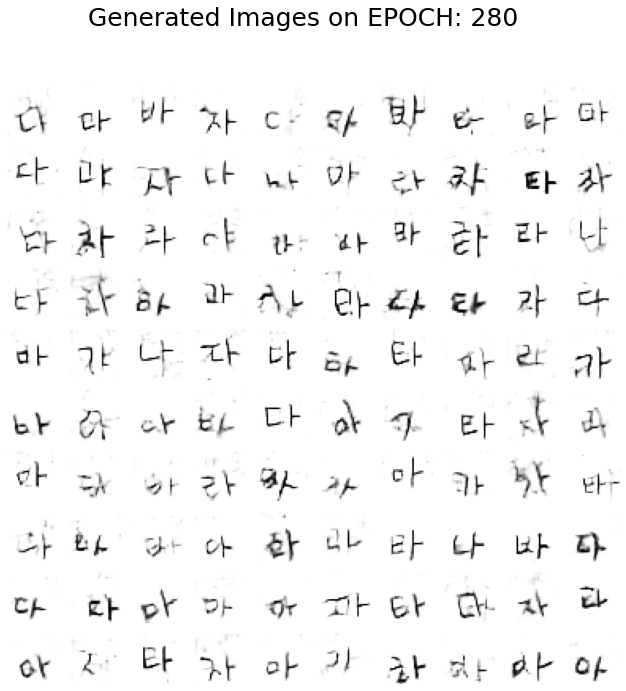

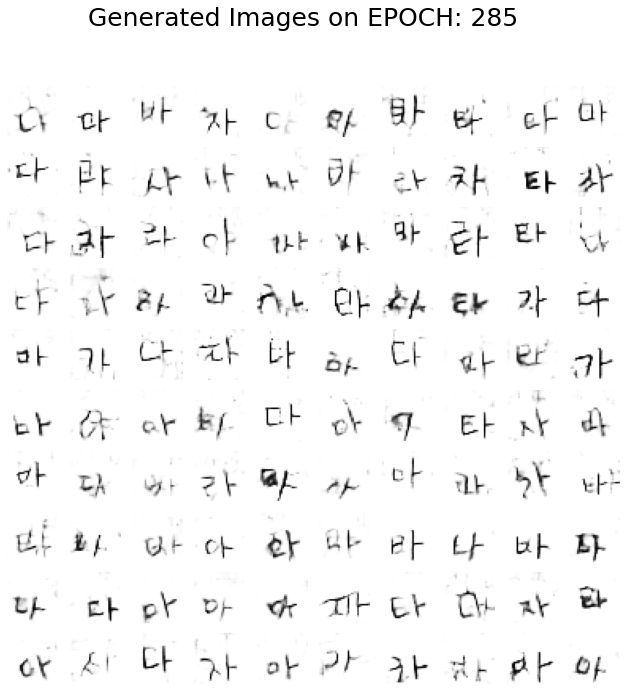

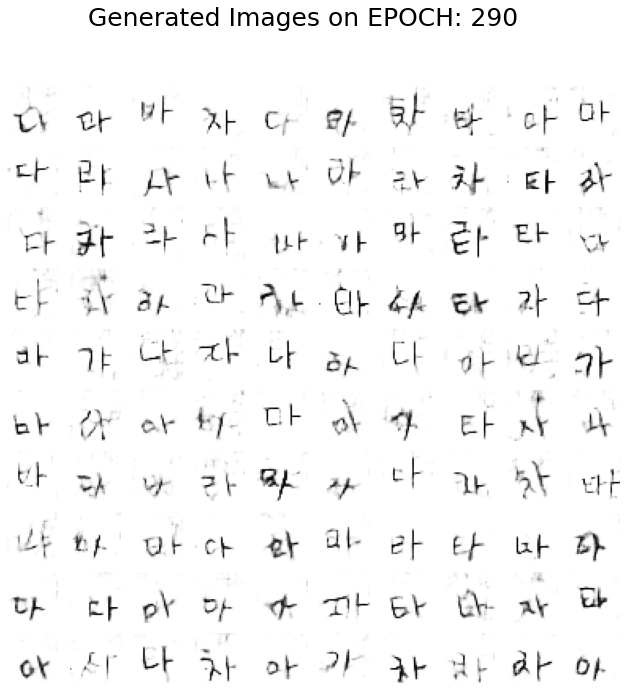

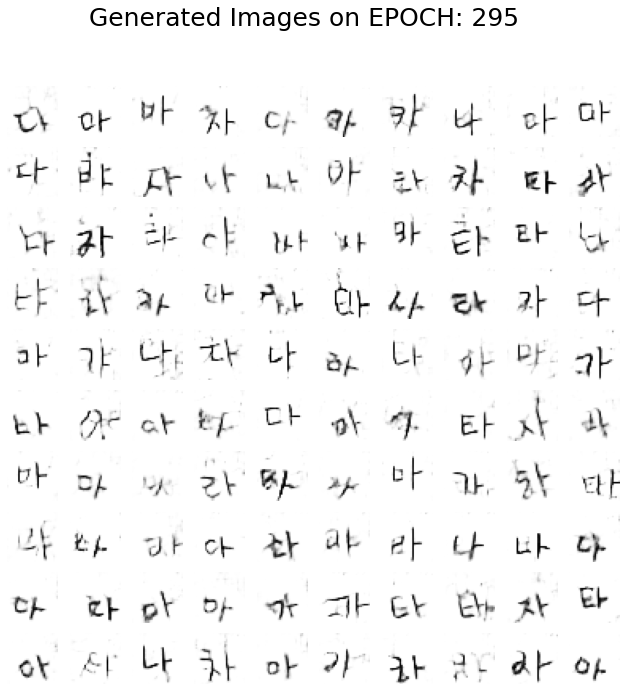

In [22]:
# 6-4. Start training
train(train_dataset, EPOCHS)